#### Author: Ganesh Rohan N

### PushPin Detection and Classification.

The objective of this assignment is to develop a quality control visual inspection system that can
automatically determine if a box of push pins is acceptable or should be rejected. The system
will use object detection to identify good and bad pins and classify them into different
categories. The goal is to train a model to inspect boxes and make decisions based on visual
data.

#### Problem Statement:
You are tasked with building an AI-based quality control system for a company that
manufactures push pins. Each box is divided into 15 bins, with exactly one good pin per bin. You
need to build a visual inspection system that detects and classifies pins into different categories
that are listed in Classes section. Based on the classification, the box will either be accepted or
rejected.

# Data Preparation

#### Original Dataset

The dataset contains a total of 310 images, split into:

1.   138 images labelled as 'good'.
2.   172 images labelled as 'bad'.

Each image is prefixed with either 'good' or 'bad' for easy differentiation.

# Data Preparation:
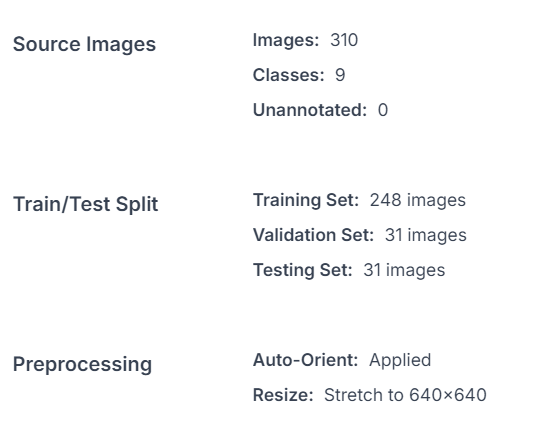




#### Data Augmentation:
External:
1.   Flip: Horizontal, Vertical
2.   Bounding Box: Exposure Between -10% and +10%

Internal:

3.   Blur, MedianBlur.
4.   ToGray, CLAHE.

#### Dataset split post Augmentation:

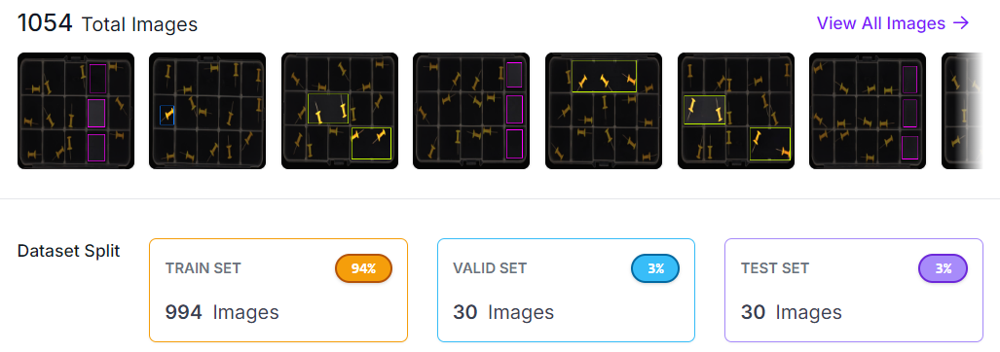



##### There are 7+ Bad images in test dataset

In [1]:
# GPU Check
!nvidia-smi

Sat Oct 12 06:14:06 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.90.07              Driver Version: 550.90.07      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla P100-PCIE-16GB           Off |   00000000:00:04.0 Off |                    0 |
| N/A   35C    P0             27W /  250W |       0MiB /  16384MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
!pip install ultralytics==8.3.5
!pip install roboflow

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics 8.3.5 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5933.9/8062.4 GB disk)


In [4]:
from ultralytics import YOLO

from IPython.display import display, Image

# Get API Key of ROBOFLOW to download the dataset.
# from google.colab import userdata
# api_key = userdata.get('api_key')

In [5]:
# Download Dataset

from roboflow import Roboflow
rf = Roboflow(api_key='')
project = rf.workspace("pushpins").project("pushpins-kkkcx")
version = project.version(9)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.3.5, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to Pushpins-9 in yolov8:: 100%|██████████| 2119/2119 [00:00<00:00, 7675.44it/s]


# Benchmark

In [57]:
# Benchmark
models =  'yolov8s.pt'

# Path to your custom dataset
data_path = '/kaggle/input/data-yaml/data.yaml'

# Benchmark each model
print(f"Benchmarking {model_name}...")
model = YOLO(model_name)
results = benchmark(model=model, data=data_path, imgsz=640, half=False, device=0)
print(results)

Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5940.2/8062.4 GB disk)

Benchmarks complete for yolo11s.pt on /kaggle/input/data-yaml/data.yaml at imgsz=640 (190.32s)
                   Format Status❔  Size (MB)  metrics/mAP50-95(B)  Inference time (ms/im)     FPS
0                 PyTorch       ✅       18.4               0.0291                   14.22   70.30
1             TorchScript       ✅       36.6               0.0057                    9.12  109.67
2                    ONNX       ✅       36.3               0.0057                   17.92   55.80
3                OpenVINO       ❌        0.0                  NaN                     NaN     NaN
4                TensorRT       ❌        0.0                  NaN                     NaN     NaN
5                  CoreML       ❌        0.0                  NaN                     NaN     NaN
6   TensorFlow SavedModel       ✅       91.1               0.0057                   54.97   18.19
7     TensorFlow GraphDef       ✅       36.4              

In [58]:
# Benchmark
models =  'yolo11s.pt'

# Path to your custom dataset
data_path = '/kaggle/input/data-yaml/data.yaml'

# Benchmark each model
print(f"Benchmarking {model_name}...")
model = YOLO(model_name)
results = benchmark(model=model, data=data_path, imgsz=640, half=False, device=0)
print(results)

Setup complete ✅ (4 CPUs, 31.4 GB RAM, 5940.2/8062.4 GB disk)

Benchmarks complete for yolo11s.pt on /kaggle/input/data-yaml/data.yaml at imgsz=640 (11.21s)
                   Format Status❔  Size (MB)  metrics/mAP50-95(B)  Inference time (ms/im)     FPS
0                 PyTorch       ✅       18.4               0.0291                   14.57   68.61
1             TorchScript       ✅       36.6               0.0057                    8.56  116.77
2                    ONNX       ❎       36.3                  NaN                     NaN     NaN
3                OpenVINO       ❌        0.0                  NaN                     NaN     NaN
4                TensorRT       ❌        0.0                  NaN                     NaN     NaN
5                  CoreML       ❌        0.0                  NaN                     NaN     NaN
6   TensorFlow SavedModel       ❌        0.0                  NaN                     NaN     NaN
7     TensorFlow GraphDef       ❌        0.0               

##### I chose the YOLOv8 model because it delivers a good balance of accuracy and speed. It shows strong detection performance with a solid mAP score and fast inference times, making it ideal for real-time applications. Its versatility across different platforms also adds to its appeal.

In [6]:
# load a pretrained model (recommended for training)
model = YOLO("yolov8s.pt")

#Start from pre-train pushpin model
# model = YOLO("/content/drive/MyDrive/Pushpin/pushpin_yolov8/weights/best.pt")

100%|██████████| 21.5M/21.5M [00:00<00:00, 234MB/s]


In [7]:
# Display model information (optional)
model.info()

YOLOv8s summary: 225 layers, 11,166,560 parameters, 0 gradients, 28.8 GFLOPs


(225, 11166560, 0, 28.816844800000002)

# Model Training

In [15]:
# Train the model on the Pushpin example dataset for 300 epochs
# Default early stopping with patience=100

results = model.train(
    data="/kaggle/input/data-yaml/data.yaml",
    epochs=300,
    imgsz=640,
    save=True,
    device=0,
    plots=True,
    batch=-1,
    project='/kaggle/working/PushPin_yolov8',
    name='pushpin_yolov8_300'
  )

New https://pypi.org/project/ultralytics/8.3.10 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.5 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/input/data-yaml/data.yaml, epochs=300, time=None, patience=100, batch=-1, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=/kaggle/working/PushPin_yolov8, name=pushpin_yolov8_3003, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina

100%|██████████| 755k/755k [00:00<00:00, 17.2MB/s]
2024-10-12 06:28:46,644	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-10-12 06:28:47,649	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=9

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 109MB/s]


AMP: checks passed ✅
AutoBatch: Computing optimal batch size for imgsz=640 at 60.0% CUDA memory utilization.
AutoBatch: CUDA:0 (Tesla P100-PCIE-16GB) 15.89G total, 0.14G reserved, 0.12G allocated, 15.63G free
      Params      GFLOPs  GPU_mem (GB)  forward (ms) backward (ms)                   input                  output
     9842443       23.59         0.365         27.41         57.81        (1, 3, 640, 640)                    list
     9842443       47.18         0.596         20.36         38.34        (2, 3, 640, 640)                    list
     9842443       94.37         1.221         24.08         64.09        (4, 3, 640, 640)                    list
     9842443       188.7         2.101         42.39         65.82        (8, 3, 640, 640)                    list
     9842443       377.5         3.926          76.1         108.8       (16, 3, 640, 640)                    list
AutoBatch: Using batch-size 38 for CUDA:0 9.42G/15.89G (59%) ✅


train: Scanning /kaggle/working/Pushpins-9/train/labels... 994 images, 0 backgrounds, 0 corrupt: 100%|██████████| 994/994 [00:00<00:00, 1110.55it/s]


train: New cache created: /kaggle/working/Pushpins-9/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 1.4.18 (you have 1.4.17). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
val: Scanning /kaggle/working/Pushpins-9/valid/labels... 30 images, 0 backgrounds, 0 corrupt: 100%|██████████| 30/30 [00:00<00:00, 2004.32it/s]

val: New cache created: /kaggle/working/Pushpins-9/valid/labels.cache


Plotting labels to /kaggle/working/PushPin_yolov8/pushpin_yolov8_3003/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000769, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.00059375), 69 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to /kaggle/working/PushPin_yolov8/pushpin_yolov8_3003
Starting training for 300 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/300      10.8G      1.374      4.419       1.34         14        640: 100%|██████████| 27/27 [00:18<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.46s/it]

                   all         30        147     0.0391      0.612       0.15     0.0557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/300      10.8G     0.9128      2.702      1.033         15        640: 100%|██████████| 27/27 [00:17<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.33it/s]

                   all         30        147     0.0391      0.612       0.15     0.0557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/300      10.6G     0.8584      2.179      1.008         17        640: 100%|██████████| 27/27 [00:17<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

                   all         30        147    0.00112     0.0068   0.000565   0.000396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/300      10.7G     0.7756      1.996     0.9881          6        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

                   all         30        147     0.0674      0.707      0.173     0.0552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/300      10.5G     0.7839      1.839     0.9862          8        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

                   all         30        147      0.038      0.408     0.0661     0.0169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/300      10.9G     0.7514      1.621     0.9742         12        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.15it/s]

                   all         30        147      0.158      0.986      0.486      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/300      10.5G     0.7569      1.477     0.9786         17        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.64it/s]

                   all         30        147      0.382      0.871      0.477      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/300      10.7G      0.729      1.369     0.9723         13        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.13it/s]

                   all         30        147      0.172          1       0.46      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/300      10.9G     0.6855      1.268     0.9657         32        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.61it/s]

                   all         30        147      0.407      0.565      0.483      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/300      10.9G     0.6735      1.168     0.9544         13        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

                   all         30        147      0.296      0.217      0.209     0.0876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/300      9.96G     0.6432      1.116     0.9511         17        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

                   all         30        147      0.241      0.993      0.417      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/300      10.1G     0.6712      1.094     0.9553         30        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

                   all         30        147      0.235      0.932       0.46      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/300      10.5G      0.643      1.016     0.9455         12        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.48it/s]

                   all         30        147      0.286      0.986      0.495      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/300      10.9G     0.6339      1.032     0.9451          7        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.39it/s]

                   all         30        147      0.296       0.85      0.412      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/300      10.5G     0.6424      1.008     0.9419         15        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

                   all         30        147      0.278      0.959      0.447      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/300      10.1G      0.597     0.9603     0.9334         14        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.60it/s]

                   all         30        147      0.262      0.993      0.469      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/300      10.4G     0.6065     0.9618     0.9354         10        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.45it/s]

                   all         30        147      0.397      0.884      0.549      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/300      10.8G        0.6     0.8774     0.9271         25        640: 100%|██████████| 27/27 [00:17<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.41it/s]

                   all         30        147      0.336      0.871      0.478      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/300      10.8G     0.6237     0.9045     0.9404          7        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.98it/s]

                   all         30        147      0.324      0.966      0.523      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/300        10G     0.5654     0.8407     0.9223         32        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

                   all         30        147      0.288      0.884      0.413      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/300      10.5G     0.5967     0.8759     0.9309         14        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.36it/s]

                   all         30        147      0.336      0.993      0.456      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/300      10.1G     0.6414     0.8789     0.9463         17        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.16it/s]

                   all         30        147      0.321      0.966      0.563      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/300      10.8G     0.5694     0.8308     0.9292          9        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.48it/s]

                   all         30        147      0.302      0.925      0.502      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/300        10G     0.5691     0.8173     0.9241         19        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

                   all         30        147      0.345      0.905      0.535       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/300      10.8G     0.5398     0.7695     0.9113         13        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         30        147       0.37      0.925      0.528      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/300        10G     0.5571     0.7709     0.9131         15        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.43it/s]

                   all         30        147      0.325      0.871      0.516        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/300      10.5G     0.5556     0.7558     0.9197         12        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.39it/s]

                   all         30        147      0.617      0.549      0.585      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/300      10.7G     0.5509     0.7725      0.924         17        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.20it/s]

                   all         30        147      0.568      0.707      0.624      0.369



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/300      10.4G     0.5654      0.771     0.9261         13        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.17it/s]

                   all         30        147      0.359      0.973      0.498      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/300      10.1G      0.567     0.7695     0.9211         16        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.50it/s]

                   all         30        147      0.591      0.512      0.574      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/300      10.4G     0.5613     0.7497     0.9286         18        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.18it/s]

                   all         30        147      0.477       0.66      0.555      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/300        10G     0.5283     0.7229     0.9129         11        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

                   all         30        147      0.327      0.973      0.546      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/300      10.4G     0.5356     0.7562     0.9045         18        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

                   all         30        147      0.342      0.993      0.464      0.277



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/300      10.7G     0.5261     0.7101     0.9027         11        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

                   all         30        147       0.39      0.769      0.516      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/300      10.5G     0.5281     0.6873     0.9032         13        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

                   all         30        147       0.38      0.898       0.54      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/300      10.1G     0.5073     0.6848     0.8958         28        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

                   all         30        147      0.589      0.701      0.619      0.355



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/300      10.8G     0.5181     0.6819     0.9066         14        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

                   all         30        147      0.558      0.609      0.571       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/300        10G     0.4964     0.6706     0.9002         12        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.36it/s]

                   all         30        147      0.335      0.932      0.538      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/300      10.5G     0.5021      0.651     0.8992          6        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

                   all         30        147      0.372      0.925      0.591       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/300      10.9G     0.4971     0.6541     0.8967         15        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.78it/s]

                   all         30        147      0.487      0.803      0.554      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/300      10.9G     0.4898     0.6332     0.8908         12        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

                   all         30        147      0.423      0.395      0.383      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/300      10.8G     0.4978     0.6438     0.8933         10        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.47it/s]

                   all         30        147      0.549      0.604      0.579      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/300      10.5G     0.4816     0.6402     0.8928         13        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.64it/s]

                   all         30        147      0.443      0.802      0.624      0.381



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/300      10.5G     0.4973     0.6457     0.8968         24        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.66it/s]

                   all         30        147      0.378      0.952      0.634      0.379



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/300      10.9G     0.4706     0.6145     0.8829          7        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

                   all         30        147      0.378      0.864      0.505      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/300      10.1G     0.4903     0.6535     0.8822         30        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.85it/s]

                   all         30        147      0.389      0.905      0.549      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/300      10.6G     0.4711      0.636     0.8915         21        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         30        147      0.483      0.834      0.609      0.366



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/300      10.9G     0.4782     0.5988     0.8906          9        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.24it/s]

                   all         30        147      0.393      0.687      0.435      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/300      10.5G      0.477     0.6005     0.8901         17        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.77it/s]

                   all         30        147      0.542      0.571      0.545      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/300      9.96G     0.4903     0.5961     0.8921          9        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.22it/s]

                   all         30        147      0.376      0.871      0.509      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/300      10.8G     0.4814      0.582     0.8872         34        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]

                   all         30        147      0.398      0.884      0.544      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/300      10.8G     0.4713     0.5951     0.8887         12        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

                   all         30        147      0.379      0.816      0.541      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/300      10.8G     0.4566     0.5807      0.878         16        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

                   all         30        147      0.545      0.514      0.506      0.295



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/300      9.93G      0.488     0.5828     0.8903         14        640: 100%|██████████| 27/27 [00:17<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.49it/s]

                   all         30        147      0.375      0.925      0.542       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/300      10.8G     0.4661     0.5774     0.8829         11        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

                   all         30        147      0.378      0.823      0.451       0.27



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/300      10.7G     0.4595     0.5664     0.8841         14        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.77it/s]

                   all         30        147      0.395      0.626      0.406      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/300      10.6G     0.4531     0.5439     0.8743         12        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.55it/s]

                   all         30        147      0.478      0.517      0.451      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/300      10.3G     0.4569     0.5626     0.8859          9        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

                   all         30        147      0.383      0.878      0.483      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/300      10.8G     0.4731     0.5518     0.8834         33        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.91it/s]

                   all         30        147      0.452      0.776       0.55      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/300      10.1G     0.4601     0.5565     0.8847         11        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.41it/s]

                   all         30        147      0.405       0.68      0.467      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/300      10.6G     0.4536     0.5452     0.8825         12        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

                   all         30        147      0.405      0.694      0.447      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/300      10.6G      0.457     0.5602     0.8747          7        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

                   all         30        147       0.43      0.728      0.452      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/300      10.8G     0.4235     0.5465     0.8727          9        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.52it/s]

                   all         30        147      0.375      0.932      0.512      0.303



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/300      10.7G     0.4432     0.5179     0.8735         22        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.54it/s]

                   all         30        147      0.387      0.816      0.494      0.299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/300      10.5G     0.4407     0.5396     0.8707         13        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.22it/s]

                   all         30        147      0.366      0.694      0.448      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/300      10.1G     0.4176     0.4996     0.8643         15        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         30        147       0.37      0.748      0.428      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/300      10.5G     0.4504     0.5305     0.8765          9        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.69it/s]

                   all         30        147       0.37       0.85      0.483      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/300      10.6G     0.4302     0.5069      0.863         21        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.12it/s]

                   all         30        147      0.445      0.694      0.483      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/300      10.6G     0.4327     0.5255     0.8625         12        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

                   all         30        147      0.395      0.837      0.482      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/300      10.6G      0.434     0.5209     0.8739         10        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.23it/s]

                   all         30        147      0.408      0.646      0.446      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/300      10.6G     0.4165     0.5087     0.8645         23        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]

                   all         30        147       0.41      0.789      0.488       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/300      10.5G     0.4203     0.5111     0.8699          8        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.47it/s]

                   all         30        147      0.403      0.605      0.432      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/300      10.8G     0.4425     0.5208     0.8723         10        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

                   all         30        147      0.399      0.748      0.444      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/300        10G     0.4289     0.4938     0.8747         15        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.49it/s]

                   all         30        147      0.426      0.565      0.434      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/300      10.6G     0.4311     0.4928     0.8728         28        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.82it/s]

                   all         30        147      0.517      0.531      0.515      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/300      10.1G      0.416     0.4798     0.8651         12        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

                   all         30        147      0.416      0.762       0.49      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/300      10.8G     0.4133     0.4759     0.8644         13        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.41it/s]

                   all         30        147      0.467      0.476      0.381      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/300      10.6G     0.3922     0.4683     0.8569         12        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

                   all         30        147      0.413       0.81      0.527      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/300      10.8G     0.4036     0.4692     0.8639         11        640: 100%|██████████| 27/27 [00:17<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.30it/s]

                   all         30        147      0.532      0.395      0.427      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/300      10.5G      0.422      0.461     0.8706         16        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

                   all         30        147       0.45      0.639      0.481      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/300      10.4G     0.4293     0.4807     0.8684         24        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.24it/s]

                   all         30        147      0.405      0.565      0.417      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/300      9.93G     0.3889     0.4539     0.8563         10        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.59it/s]

                   all         30        147      0.424      0.592      0.441      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/300      10.5G     0.4185     0.4886     0.8635         14        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

                   all         30        147      0.412      0.619       0.44      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/300      10.8G     0.4139     0.4797     0.8716         27        640: 100%|██████████| 27/27 [00:17<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.48it/s]

                   all         30        147      0.376      0.503      0.371      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/300      10.8G     0.4005     0.4571      0.866          7        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.66it/s]

                   all         30        147      0.473      0.544      0.407      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/300      10.1G     0.3951      0.446     0.8549         14        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.64it/s]

                   all         30        147      0.397      0.789      0.491      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/300      10.5G     0.3996     0.4535     0.8593         10        640: 100%|██████████| 27/27 [00:17<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

                   all         30        147       0.59      0.333      0.439      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/300        10G     0.4143     0.4658     0.8671         18        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.32it/s]

                   all         30        147      0.443      0.605      0.439      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/300      10.5G     0.3823     0.4578     0.8504         23        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.76it/s]

                   all         30        147      0.418      0.558       0.39      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/300      10.7G     0.3887     0.4693     0.8565         16        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.56it/s]

                   all         30        147      0.452      0.707       0.49      0.291



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/300      10.4G     0.4005     0.4641     0.8564         18        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

                   all         30        147      0.509      0.381      0.401      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/300      10.7G      0.397     0.4461     0.8631         24        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

                   all         30        147      0.488      0.544      0.437      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/300      10.8G     0.3821     0.4325     0.8533         20        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

                   all         30        147      0.413      0.531      0.415      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/300      9.96G     0.3756     0.4279     0.8445          9        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]

                   all         30        147      0.485      0.544      0.438      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/300      10.4G     0.3892     0.4402     0.8478         38        640: 100%|██████████| 27/27 [00:17<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.88it/s]

                   all         30        147      0.425      0.599      0.414      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/300      10.1G     0.4078     0.4526     0.8613         22        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]

                   all         30        147      0.429      0.469      0.361      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/300      10.8G     0.3767     0.4412     0.8501          9        640: 100%|██████████| 27/27 [00:17<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.27it/s]

                   all         30        147       0.44      0.646      0.475      0.289



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/300      9.96G     0.3796     0.4391     0.8555         14        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

                   all         30        147      0.466      0.558      0.447      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/300      10.8G      0.381     0.4356     0.8513         14        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

                   all         30        147        0.5      0.408      0.392      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/300      10.6G     0.3834     0.4191     0.8538         11        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.61it/s]

                   all         30        147      0.425      0.728      0.463      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/300      10.9G     0.3486     0.3874     0.8442         18        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.19it/s]

                   all         30        147      0.455      0.476      0.399      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/300        10G     0.3742     0.4173     0.8539         17        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.59it/s]

                   all         30        147      0.465       0.49      0.427      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/300      10.5G     0.3689     0.3934     0.8538         17        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.15it/s]

                   all         30        147      0.432      0.646      0.418      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/300      10.1G     0.3625     0.4081     0.8505         21        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.84it/s]

                   all         30        147      0.508      0.415      0.407      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/300      10.8G     0.3589     0.3985     0.8445          8        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

                   all         30        147      0.407      0.537      0.396      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/300      10.6G     0.3744     0.4195     0.8465         14        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.88it/s]

                   all         30        147      0.475      0.571      0.408      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/300      10.8G     0.3591        0.4     0.8484         10        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.59it/s]

                   all         30        147      0.552      0.435      0.429      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/300      9.96G     0.3573     0.4116     0.8463          5        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.53it/s]

                   all         30        147      0.444      0.673      0.486      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/300      10.5G       0.35     0.4087     0.8472         12        640: 100%|██████████| 27/27 [00:17<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.90it/s]

                   all         30        147      0.425      0.653      0.454      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/300      10.8G     0.3396     0.3821      0.841         25        640: 100%|██████████| 27/27 [00:17<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

                   all         30        147      0.472      0.231      0.303      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/300      10.5G     0.3502     0.3936     0.8441         13        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.50it/s]

                   all         30        147      0.514      0.259      0.356      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/300      10.5G     0.3612     0.4013     0.8485         11        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.90it/s]

                   all         30        147      0.468      0.354      0.359      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/300      10.5G     0.3551     0.3938     0.8437         21        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.60it/s]

                   all         30        147      0.452      0.354      0.347      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/300      10.9G     0.3487     0.3771     0.8418         13        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

                   all         30        147      0.445      0.361      0.352      0.201



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/300      10.8G     0.3504     0.3986     0.8395         14        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.57it/s]

                   all         30        147      0.462      0.497        0.4      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/300      9.96G     0.3344     0.3641     0.8377         36        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

                   all         30        147       0.47      0.524      0.421      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/300      10.8G     0.3347      0.363     0.8371         21        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.91it/s]

                   all         30        147      0.472      0.347      0.349      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/300      10.9G     0.3545     0.3782     0.8557         32        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.59it/s]

                   all         30        147      0.471      0.218      0.317      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/300      10.4G     0.3489     0.3883     0.8468          7        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.23it/s]

                   all         30        147      0.381      0.667      0.425      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/300      9.95G     0.3371     0.3641     0.8348         10        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

                   all         30        147      0.566       0.32      0.409      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/300      10.8G     0.3603     0.3847     0.8496         19        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.86it/s]

                   all         30        147      0.527      0.327      0.393      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/300      9.97G     0.3467     0.3843     0.8435         10        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.90it/s]

                   all         30        147      0.487      0.388      0.386      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/300      10.4G     0.3293     0.3769     0.8403         15        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.84it/s]

                   all         30        147      0.473      0.476      0.407      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/300      9.99G     0.3335     0.3782     0.8415         13        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]

                   all         30        147      0.482      0.449      0.401      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/300      10.5G     0.3467     0.3812     0.8403         18        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.43it/s]

                   all         30        147       0.44      0.497      0.398      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/300      10.7G     0.3228     0.3524     0.8383          9        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.88it/s]

                   all         30        147      0.404      0.442      0.375       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/300      10.6G     0.3382     0.3726     0.8315         15        640: 100%|██████████| 27/27 [00:17<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.30it/s]

                   all         30        147      0.455      0.306      0.358       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/300        10G     0.3265     0.3435     0.8447         14        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.94it/s]

                   all         30        147      0.496      0.456      0.426      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/300      10.9G     0.3379     0.3602     0.8383         33        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.90it/s]

                   all         30        147      0.468      0.299      0.352      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/300      9.93G     0.3313     0.3668     0.8422          8        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.19it/s]

                   all         30        147      0.497      0.551      0.435      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/300      10.8G     0.3255      0.371      0.836         11        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

                   all         30        147      0.659      0.184      0.404       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/300      10.6G     0.3389     0.3475     0.8412         20        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.99it/s]

                   all         30        147      0.537      0.245       0.34      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/300      10.5G     0.3341     0.3483     0.8413         14        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.79it/s]

                   all         30        147      0.515      0.354      0.375      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/300      9.94G     0.3279     0.3417     0.8346         18        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.83it/s]

                   all         30        147       0.54      0.415      0.439       0.27



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/300      10.6G     0.3268     0.3436     0.8386         16        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.47it/s]

                   all         30        147      0.482      0.279      0.344      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/300      9.93G     0.3162     0.3288     0.8358         19        640: 100%|██████████| 27/27 [00:17<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.12it/s]

                   all         30        147      0.532      0.286      0.375      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/300      10.8G     0.3177     0.3444     0.8367         20        640: 100%|██████████| 27/27 [00:17<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.78it/s]

                   all         30        147       0.52      0.265      0.367      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/300      10.1G     0.3147     0.3186     0.8374         11        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.75it/s]

                   all         30        147      0.464      0.476      0.452      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/300      10.5G     0.3078     0.3415     0.8223         11        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.95it/s]

                   all         30        147      0.504      0.435      0.434      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/300      10.1G     0.3186     0.3426     0.8388         10        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.96it/s]

                   all         30        147      0.644      0.259       0.42      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/300      10.4G     0.3083     0.3377     0.8279         12        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.72it/s]

                   all         30        147      0.526      0.272      0.389      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/300      10.6G      0.314     0.3312     0.8239          8        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

                   all         30        147      0.534      0.265       0.39      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/300      10.6G     0.3263     0.3368     0.8418         10        640: 100%|██████████| 27/27 [00:17<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.91it/s]

                   all         30        147      0.347      0.347      0.311       0.19
EarlyStopping: Training stopped early as no improvement observed in last 100 epochs. Best results observed at epoch 43, best model saved as best.pt.
To update EarlyStopping(patience=100) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



143 epochs completed in 0.734 hours.
Optimizer stripped from /kaggle/working/PushPin_yolov8/pushpin_yolov8_3003/weights/last.pt, 20.0MB
Optimizer stripped from /kaggle/working/PushPin_yolov8/pushpin_yolov8_3003/weights/best.pt, 20.0MB

Validating /kaggle/working/PushPin_yolov8/pushpin_yolov8_3003/weights/best.pt...
Ultralytics 8.3.5 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 186 layers, 9,831,147 parameters, 0 gradients, 23.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.90it/s]


                   all         30        147      0.443      0.801      0.623       0.38
                 1_pin         30        147      0.443      0.801      0.623       0.38
Speed: 0.2ms preprocess, 4.5ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to /kaggle/working/PushPin_yolov8/pushpin_yolov8_3003


In [16]:
#Download
import shutil
shutil.make_archive('PushPin_yolov8_output', 'zip', '/kaggle/working/PushPin_yolov8')

'/kaggle/working/PushPin_yolov8_output.zip'

# Model Evaluation

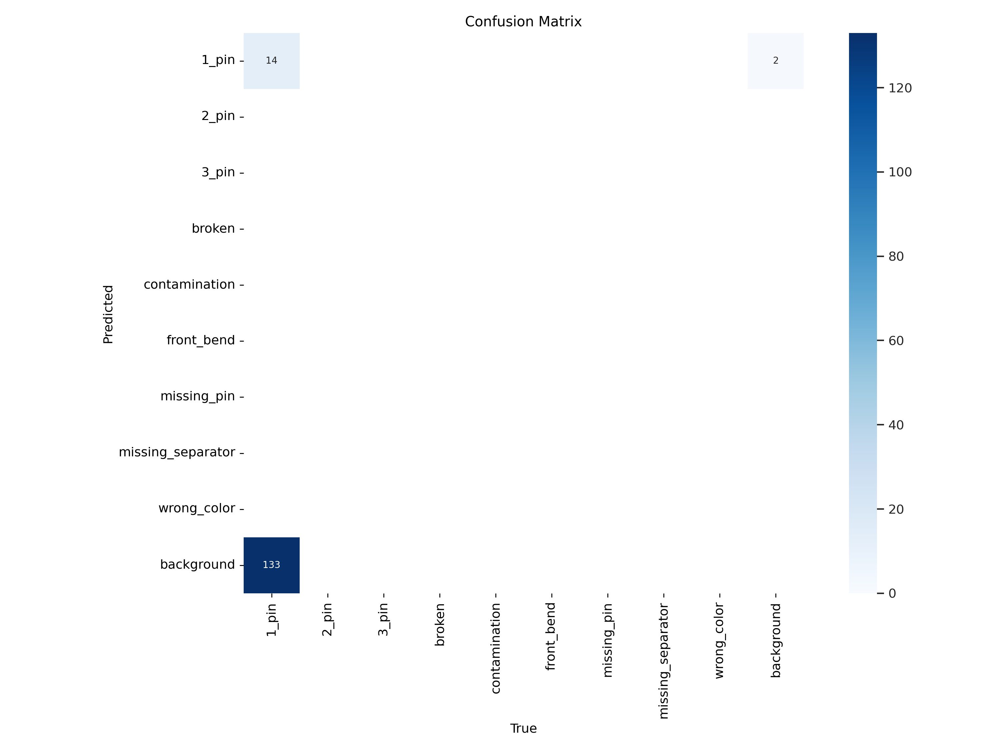

In [41]:
Image(filename=f'/kaggle/working/PushPin_yolov8/pushpin_yolov8_3003/confusion_matrix.png', width=600)

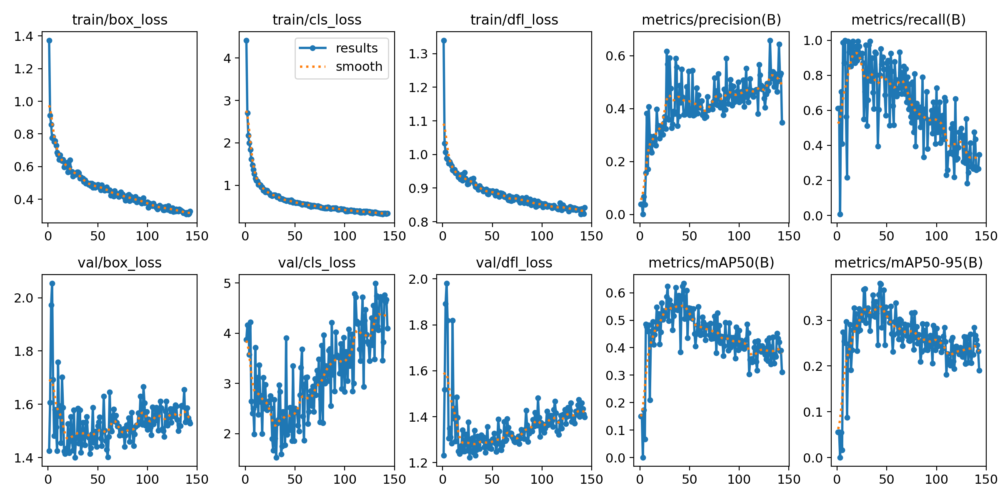

In [40]:
Image(filename=f'/kaggle/working/PushPin_yolov8/pushpin_yolov8_3003/results.png', width=600)

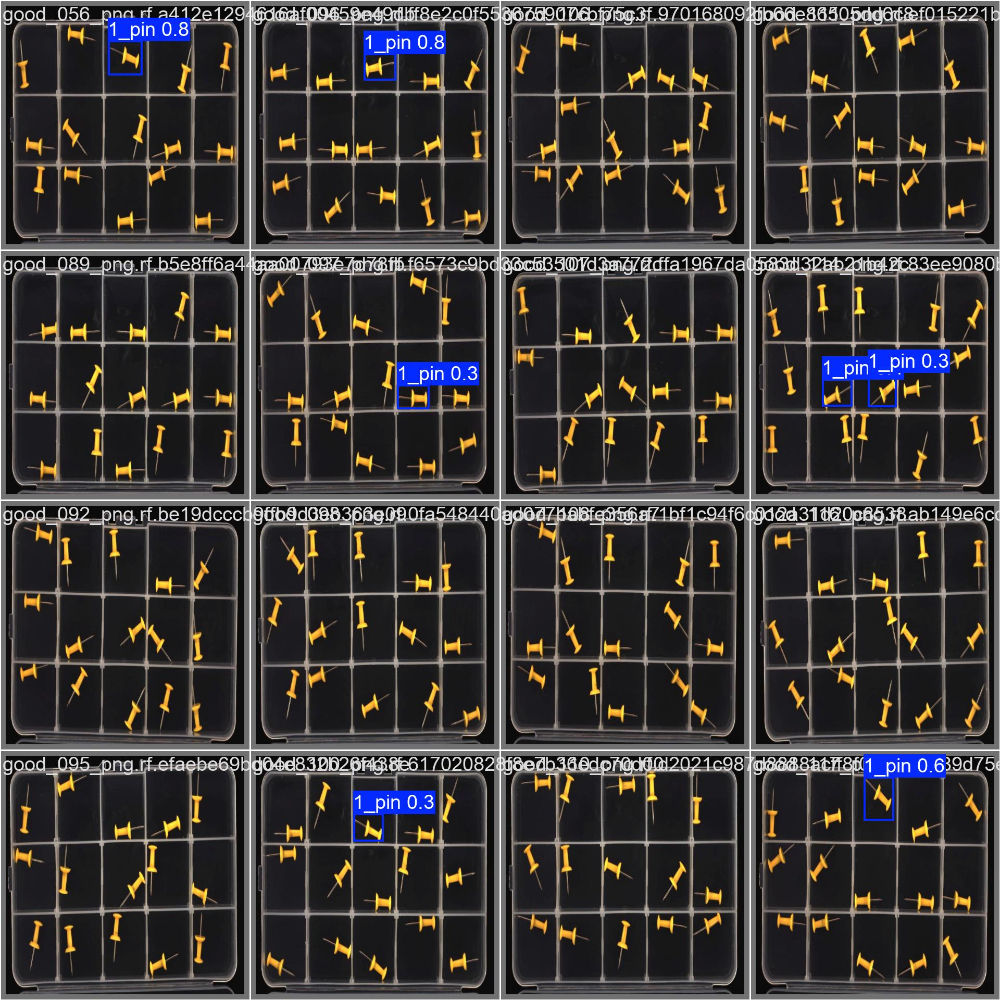

In [42]:
Image(filename=f'/kaggle/working/PushPin_yolov8/pushpin_yolov8_3003/val_batch0_pred.jpg', width=600)

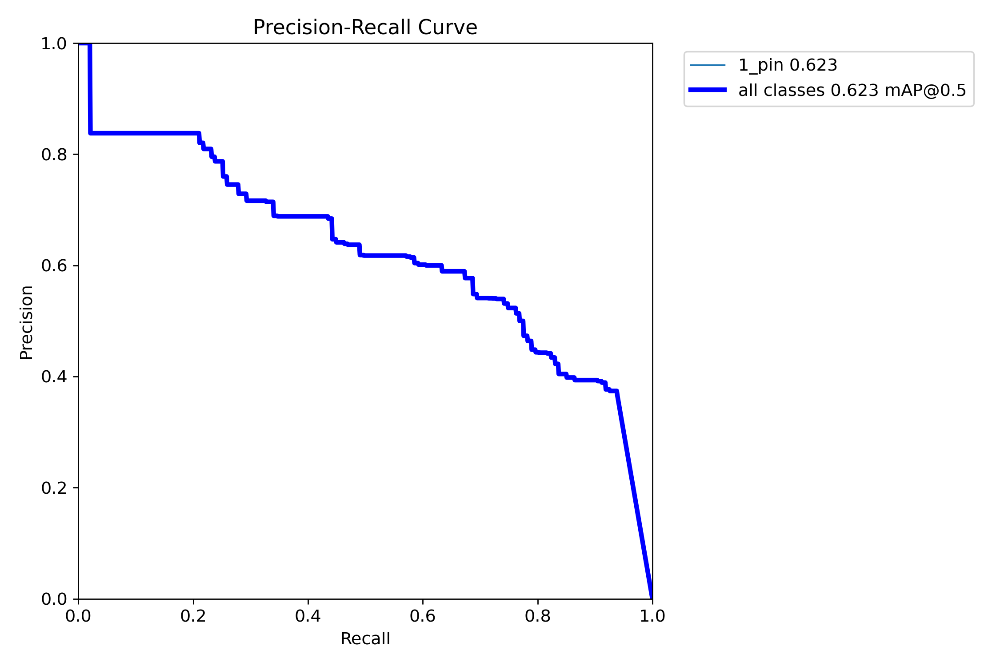

In [44]:
Image(filename=f'/kaggle/working/PushPin_yolov8/pushpin_yolov8_3003/PR_curve.png', width=600)

In [49]:
model.info()

Model summary: 249 layers, 9,842,443 parameters, 0 gradients, 23.6 GFLOPs


(249, 9842443, 0, 23.591372799999995)

In [50]:
validation_results = model.val(
    data="/kaggle/input/data-yaml/data.yaml",
    imgsz=640,
    batch=16,
    conf=0.25,
    iou=0.5,
    device="0"
  )

Ultralytics 8.3.5 🚀 Python-3.10.14 torch-2.4.0 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 186 layers, 9,831,147 parameters, 0 gradients, 23.4 GFLOPs


val: Scanning /kaggle/working/Pushpins-9/valid/labels.cache... 30 images, 0 backgrounds, 0 corrupt: 100%|██████████| 30/30 [00:00<?, ?it/s]
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.90it/s]


                   all         30        147      0.778     0.0952      0.432      0.301
                 1_pin         30        147      0.778     0.0952      0.432      0.301
Speed: 0.2ms preprocess, 6.8ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/detect/val


os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


In [51]:
print(validation_results.box.map50)  # mAP50
print(validation_results.box.map75)  # mAP75

0.4320263157894737
0.37225643097643096


In [52]:
print(validation_results.box.maps) # list of mAP50-95 for each category

[    0.30123     0.30123     0.30123     0.30123     0.30123     0.30123     0.30123     0.30123     0.30123]


# Inference with Custom Model (Box Accept/Reject)

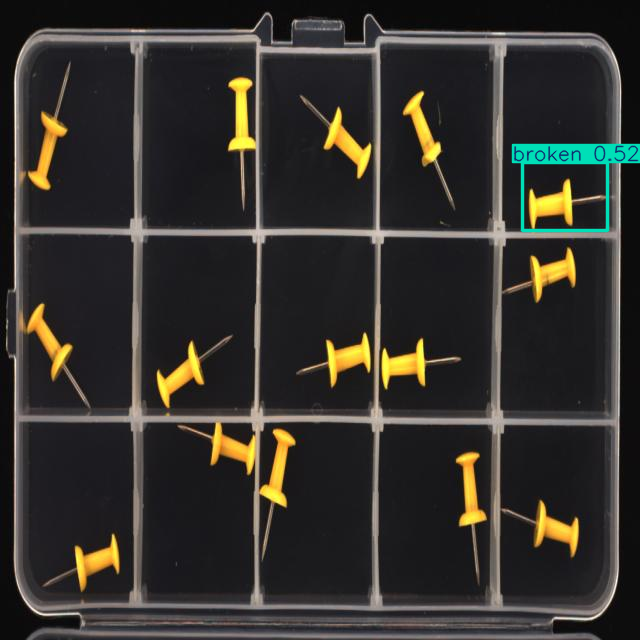

Rejected


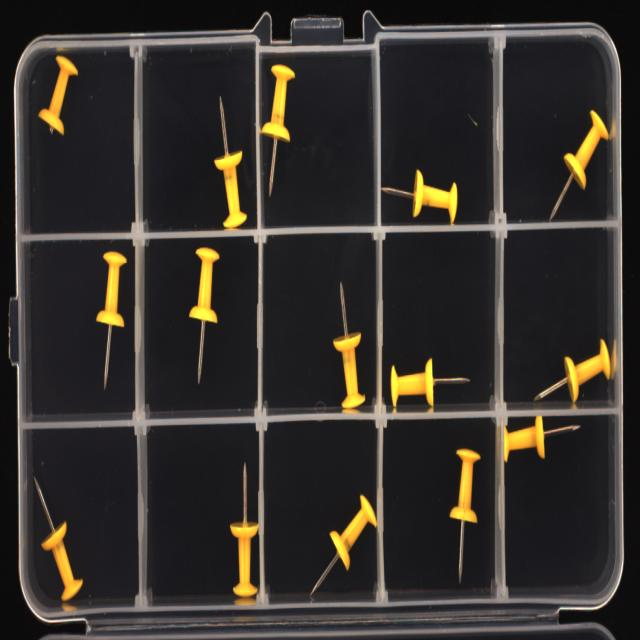

Rejected


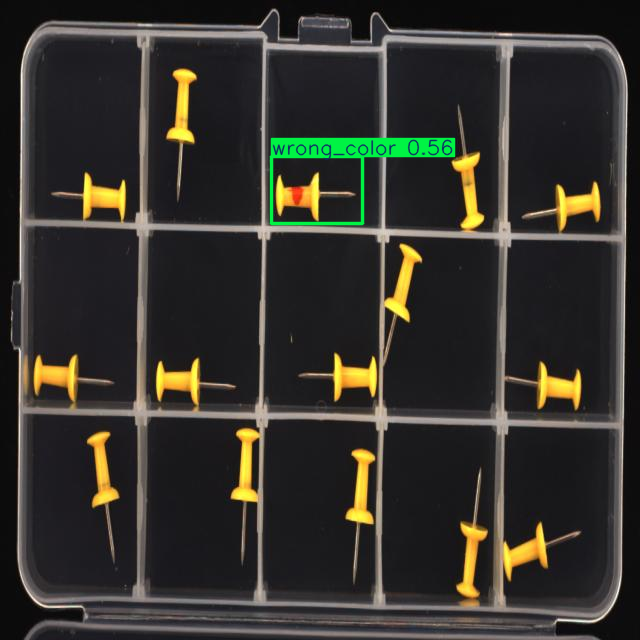

Rejected


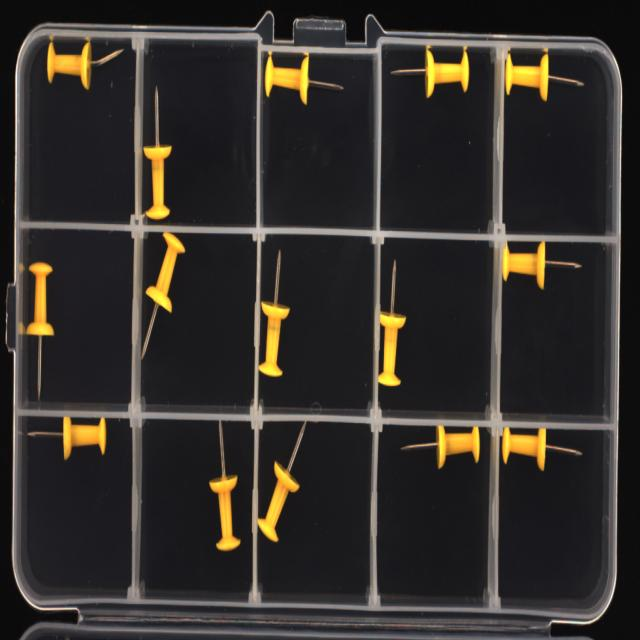

Rejected


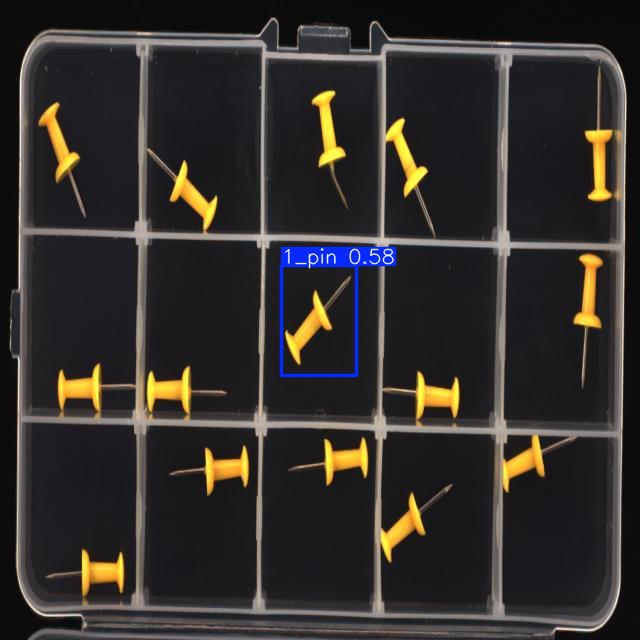

Accepted


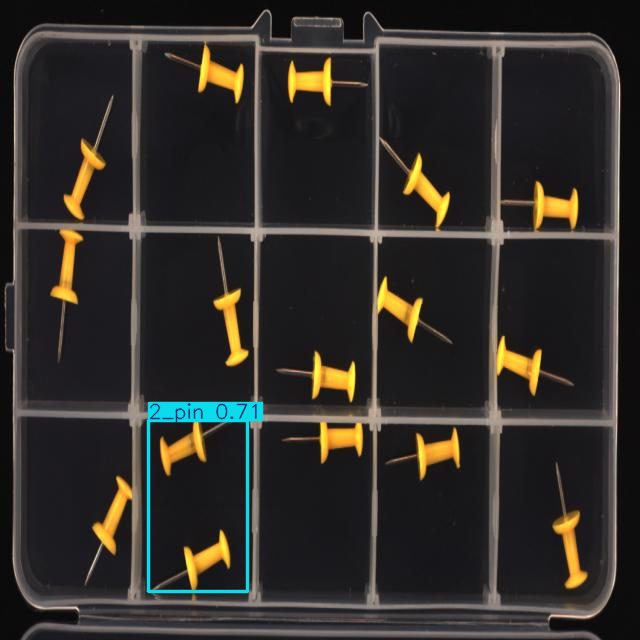

Rejected


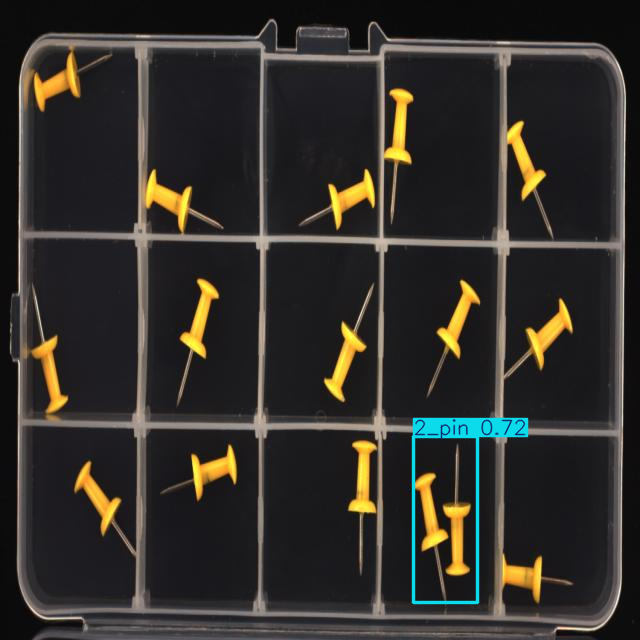

Rejected


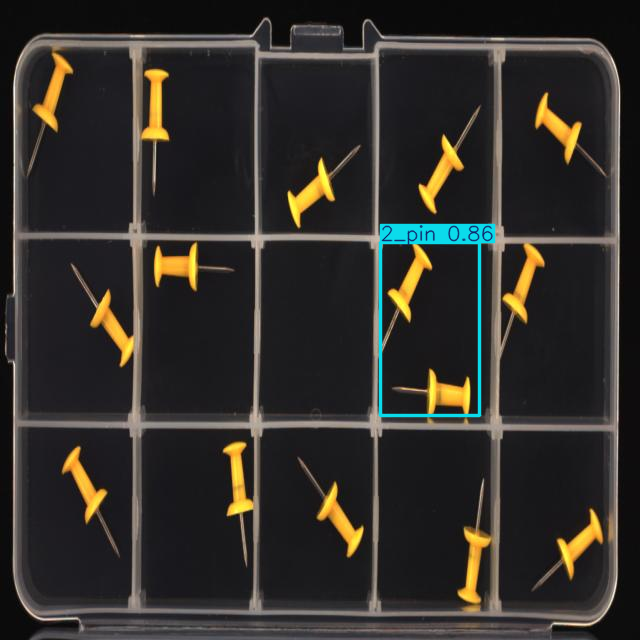

Rejected


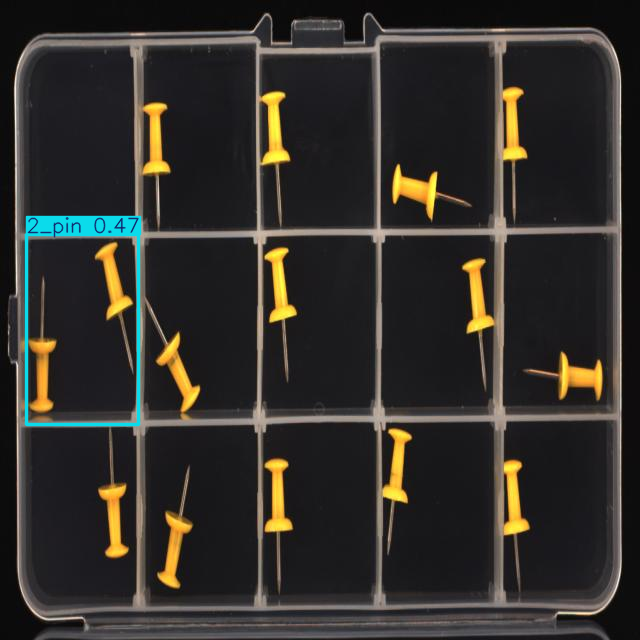

Rejected


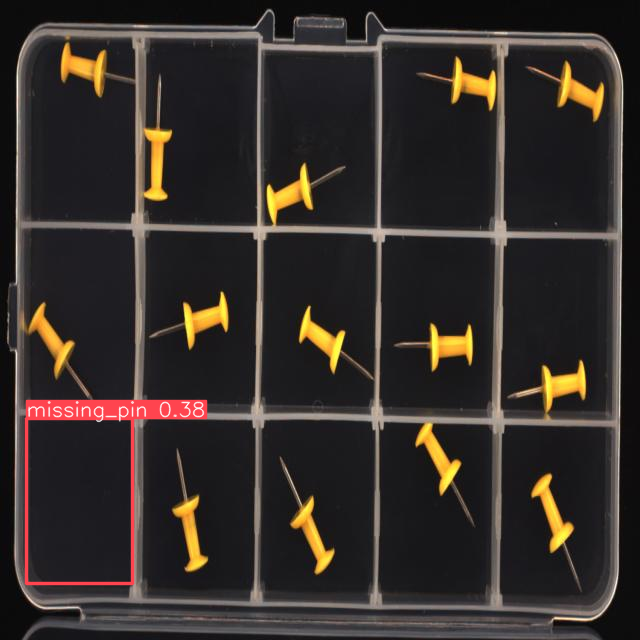

Rejected


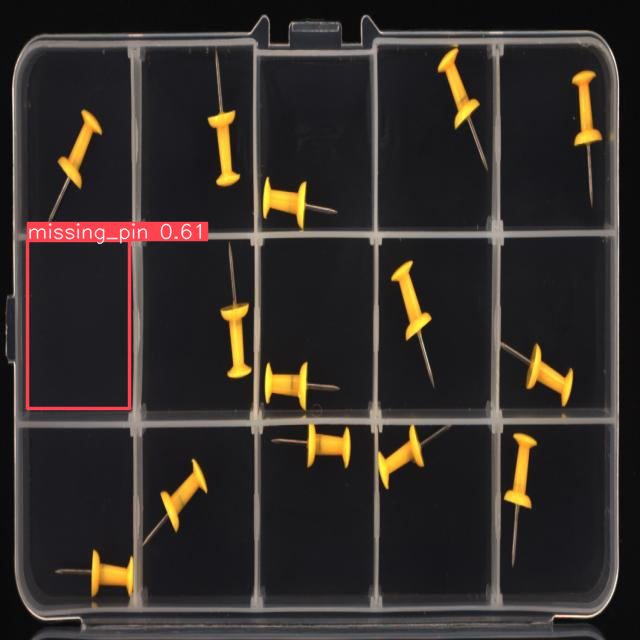

Rejected


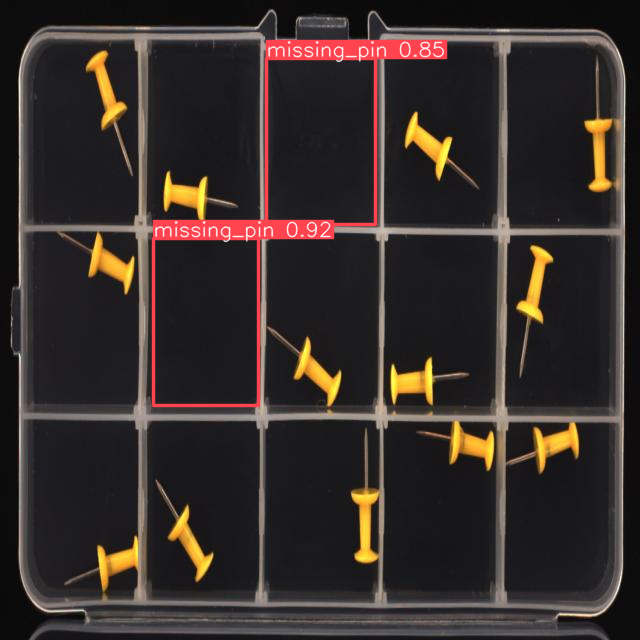

Rejected


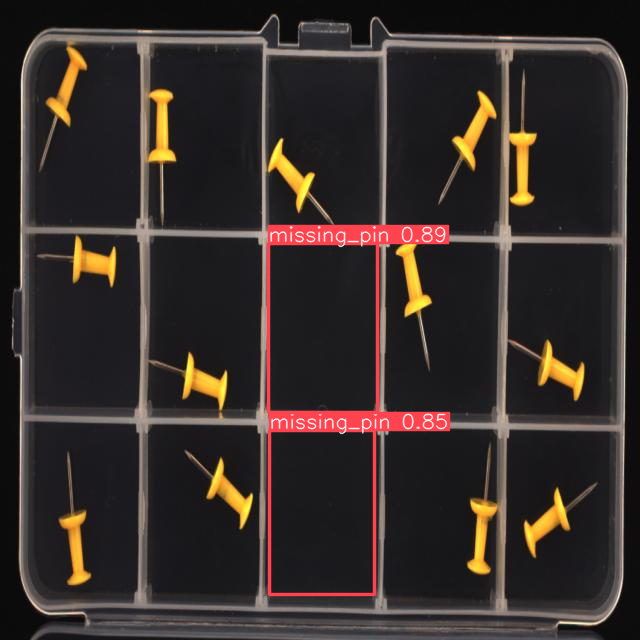

Rejected


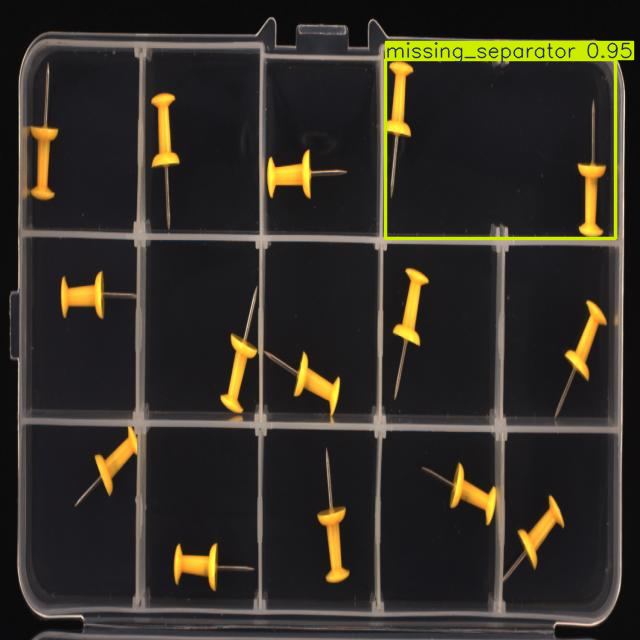

Rejected


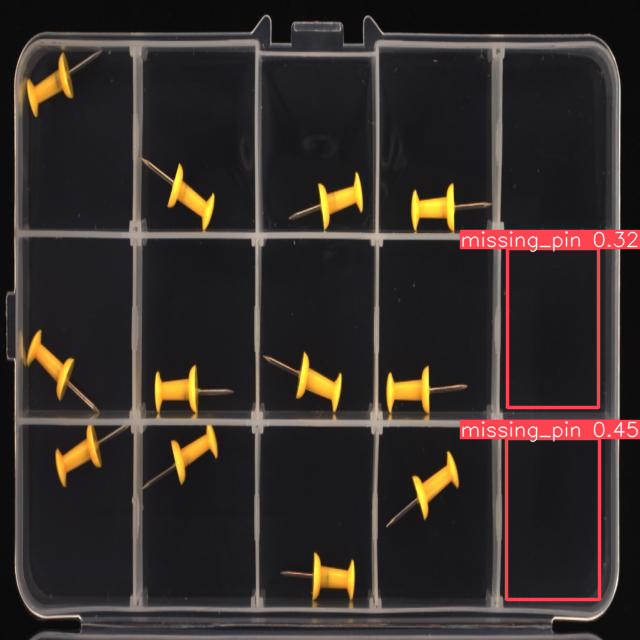

Rejected


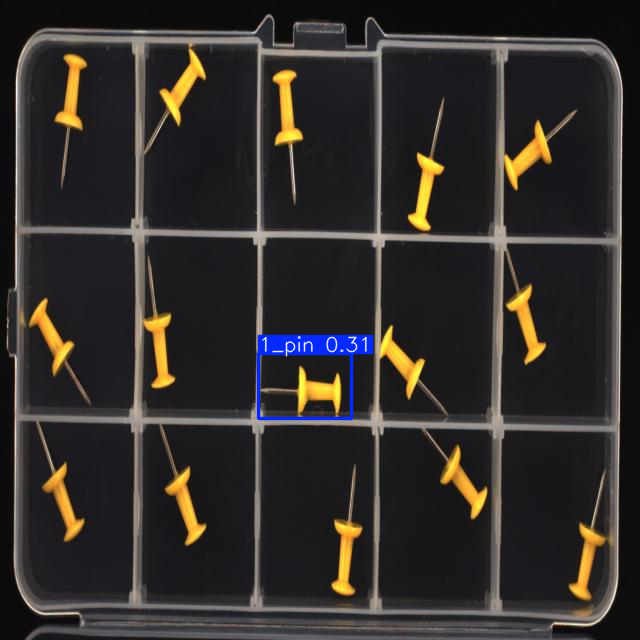

Accepted


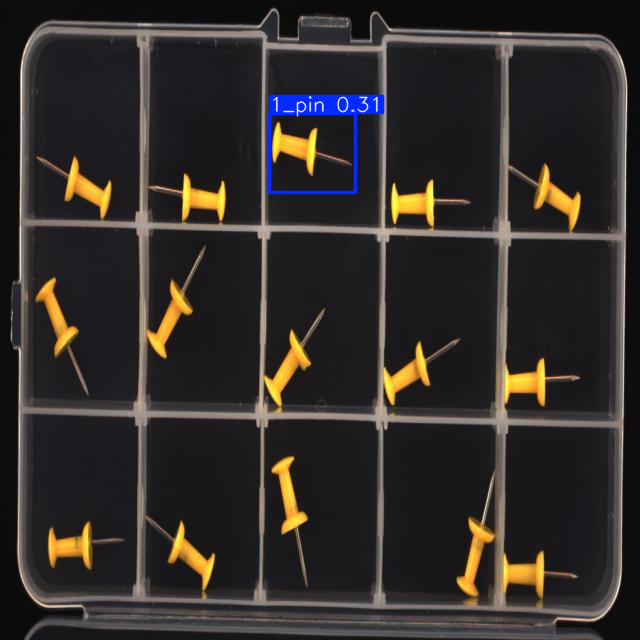

Accepted


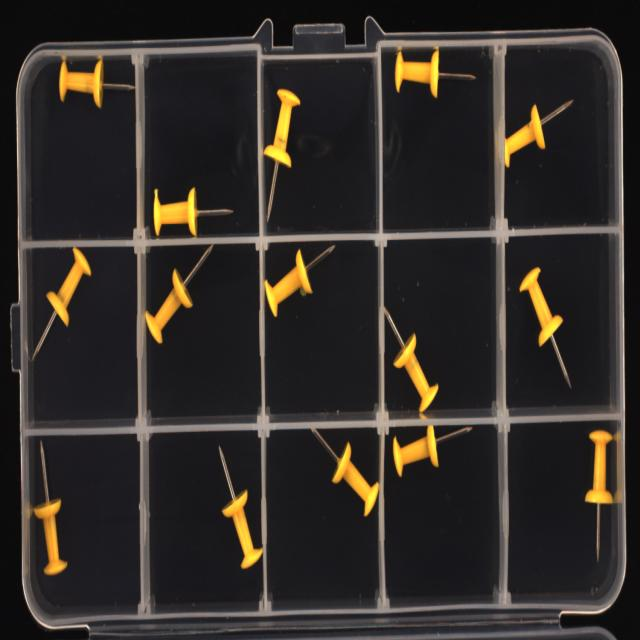

Rejected


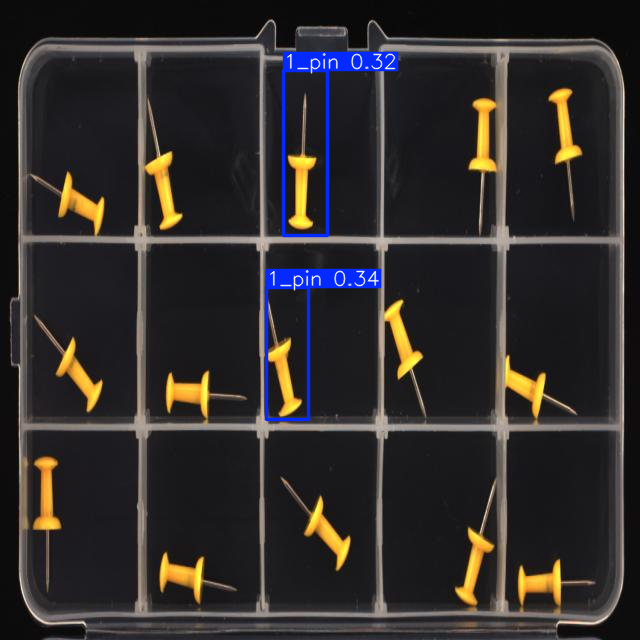

Accepted


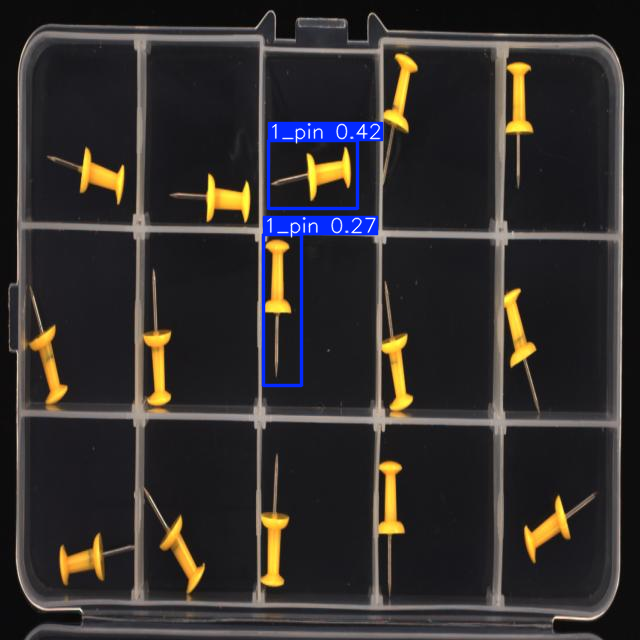

Accepted


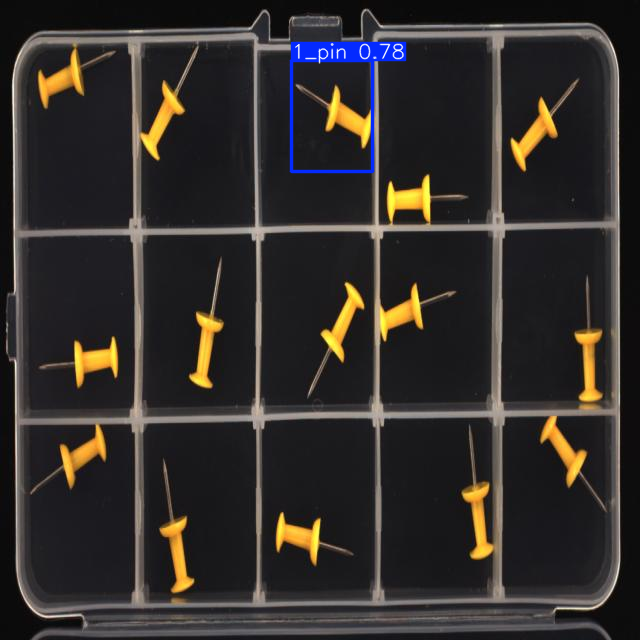

Accepted


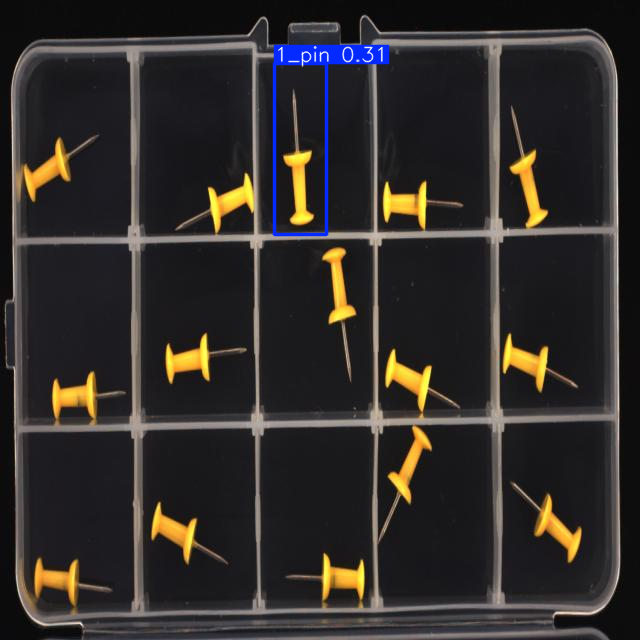

Accepted


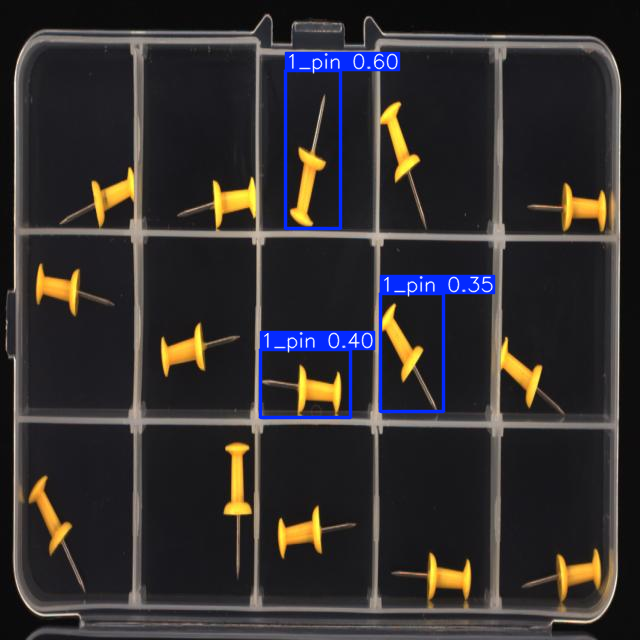

Accepted


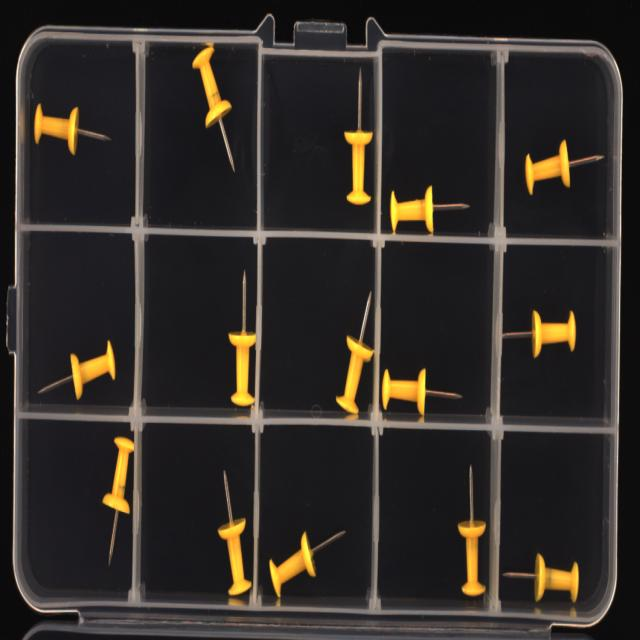

Rejected


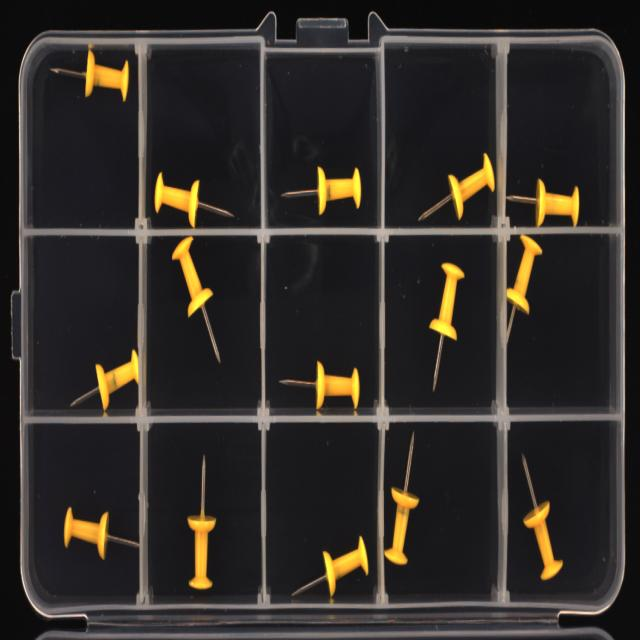

Rejected


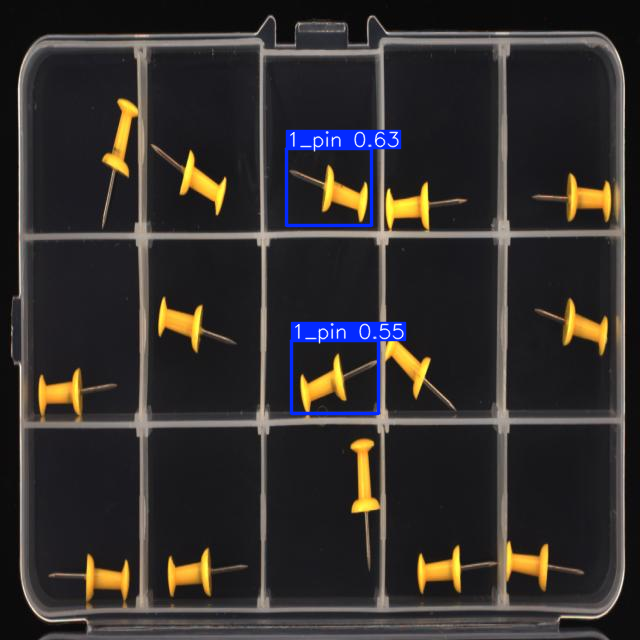

Accepted


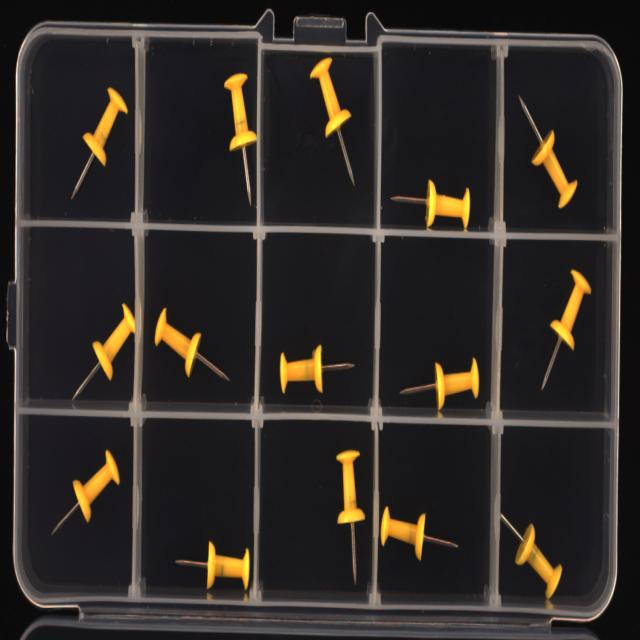

Rejected


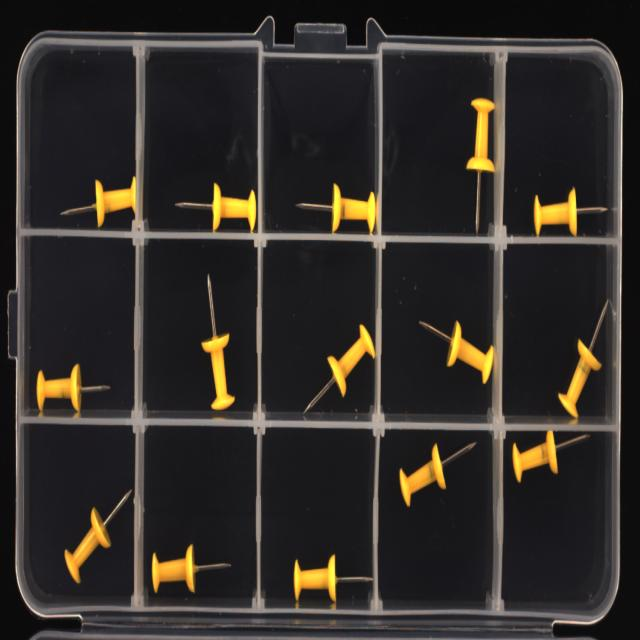

Rejected


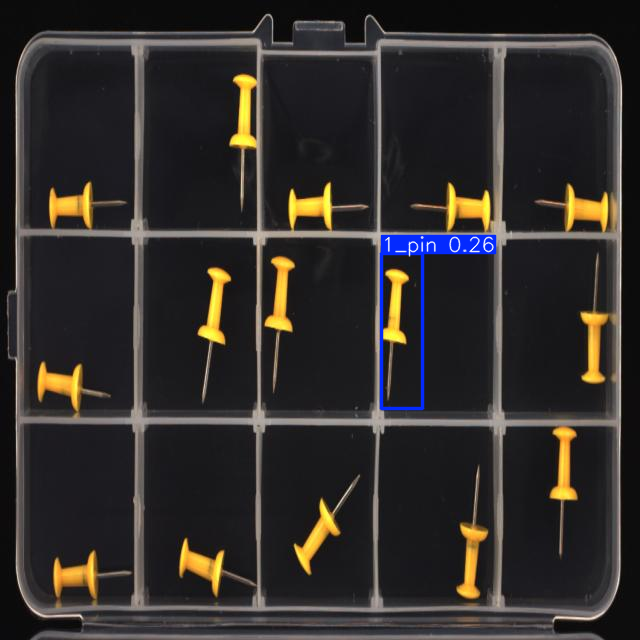

Accepted


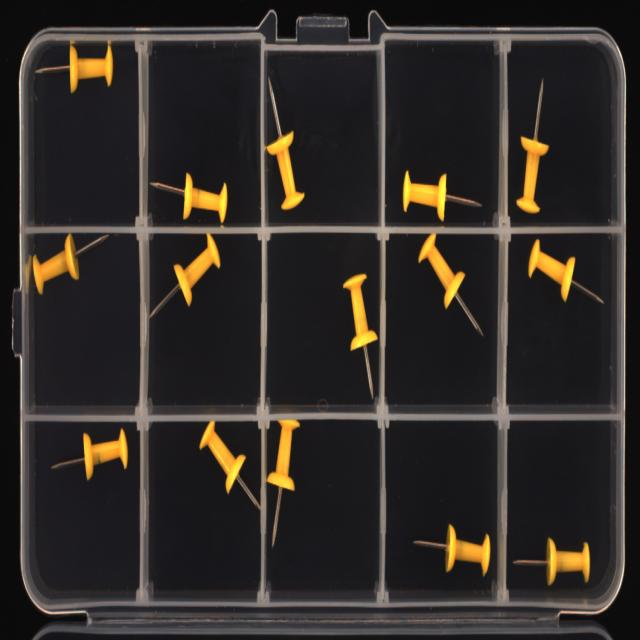

Rejected
Total Images: 30
Images Accepted: 10
Images Rejected: 20


In [53]:
# Run batched inference on a list of images
results = model(
    source='/kaggle/working/Pushpins-9/test/images',
    iou=0.5,
    conf=0.25
)  # return a generator of Results objects

from IPython import display
display.clear_output()

Accepted = 0
Rejected = 0

# Process results generator
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    detected_classes = [box.cls for box in boxes]  # Get the detected classes
    classes = [int(cls.item()) for cls in detected_classes]
    result.show()
    if len(classes) == classes.count(0) and len(classes) != 0:
        print("Accepted")
        Accepted += 1
    else:
        print("Rejected")
        Rejected += 1
        
print(f"Total Images: {Accepted + Rejected}")
print(f"Images Accepted: {Accepted}")
print(f"Images Rejected: {Rejected}")

### Key Challenges:
Imbalanced Dataset: The dataset exhibited a significant imbalance in the number of instances per class. The "1_pin" class had a substantial number of examples, whereas other defect classes had far fewer. This imbalance posed a challenge in training a model to accurately identify defects.

### Model Performance:

Precision and Recall: The model achieved a precision of 0.778 and a recall of 0.0952 on the validation set. The precision indicates the model's ability to correctly identify defects, while the recall reflects its ability to capture all true defects.

mAP (mean Average Precision): The model obtained an mAP50 of 0.432 and an mAP50-95 of 0.301. These metrics suggest the model's ability to detect and classify defects with moderate accuracy.

Confusion Matrix: The confusion matrix highlights the model's ability to correctly classify the "background" class, suggesting that the model is effective in detecting the absence of pushpins. However, the matrix also reveals misclassifications across different defect classes, indicating that the model struggles to accurately distinguish between certain defects.

### Final Decision 

Overall, the model demonstrated descent performance in identifying defective pushpins. While there are challenges related to the imbalanced and small dataset, this presents an opportunity for improvement. In the next enhancement, we will focus on expanding the dataset and addressing the current issues, which will likely lead to increased accuracy and effectiveness for real-world deployment.